# Customer Segmentation

In [2]:
import pandas as pd

In [3]:
df = pd.read_csv('Data/Wholesale customers data.csv')

In [4]:
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,2,3,12669,9656,7561,214,2674,1338
1,2,3,7057,9810,9568,1762,3293,1776
2,2,3,6353,8808,7684,2405,3516,7844
3,1,3,13265,1196,4221,6404,507,1788
4,2,3,22615,5410,7198,3915,1777,5185


In [5]:
df = df.rename(columns={'Delicassen': 'Delicatessen'})
df['Channel'] = df['Channel'].map({1: 'HoReCa', 2: 'Retail'})
df['Region'] = df['Region'].map({1: 'Lisbon', 2: 'Porto', 3:'Other'})

In [6]:
df.Region.value_counts()

Other     316
Lisbon     77
Porto      47
Name: Region, dtype: int64

In [7]:
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
0,Retail,Other,12669,9656,7561,214,2674,1338
1,Retail,Other,7057,9810,9568,1762,3293,1776
2,Retail,Other,6353,8808,7684,2405,3516,7844
3,HoReCa,Other,13265,1196,4221,6404,507,1788
4,Retail,Other,22615,5410,7198,3915,1777,5185


In [8]:
df.columns.tolist()

['Channel',
 'Region',
 'Fresh',
 'Milk',
 'Grocery',
 'Frozen',
 'Detergents_Paper',
 'Delicatessen']

In [9]:
features = [
    'Channel',
    'Region',
    'Fresh',
    'Milk',
    'Grocery',
    'Frozen',
    'Detergents_Paper',
    'Delicatessen'
]
df[features].describe()

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
count,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000
mean,12000.297727,5796.265909,7951.277273,3071.931818,2881.493182,1524.870455
std,12647.328865,7380.377175,9503.162829,4854.673333,4767.854448,2820.105937
min,3.000000,55.000000,3.000000,25.000000,3.000000,3.000000
25%,3127.750000,1533.000000,2153.000000,742.250000,256.750000,408.250000
50%,8504.000000,3627.000000,4755.500000,1526.000000,816.500000,965.500000
75%,16933.750000,7190.250000,10655.750000,3554.250000,3922.000000,1820.250000
max,112151.000000,73498.000000,92780.000000,60869.000000,40827.000000,47943.000000


In [10]:
df

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
0,Retail,Other,12669,9656,7561,214,2674,1338
1,Retail,Other,7057,9810,9568,1762,3293,1776
2,Retail,Other,6353,8808,7684,2405,3516,7844
3,HoReCa,Other,13265,1196,4221,6404,507,1788
4,Retail,Other,22615,5410,7198,3915,1777,5185
...,...,...,...,...,...,...,...,...
435,HoReCa,Other,29703,12051,16027,13135,182,2204
436,HoReCa,Other,39228,1431,764,4510,93,2346
437,Retail,Other,14531,15488,30243,437,14841,1867
438,HoReCa,Other,10290,1981,2232,1038,168,2125


In [11]:
df.to_csv('Data/data_processed.csv')

In [12]:
#Processed data, now onto Exploratory data analysis

In [13]:
import matplotlib
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import matplotlib.pyplot as plt
plt.style.use('ggplot')

import seaborn as sns

In [14]:
df = pd.read_csv('Data/data_processed.csv', index_col=0)

In [15]:
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
0,Retail,Other,12669,9656,7561,214,2674,1338
1,Retail,Other,7057,9810,9568,1762,3293,1776
2,Retail,Other,6353,8808,7684,2405,3516,7844
3,HoReCa,Other,13265,1196,4221,6404,507,1788
4,Retail,Other,22615,5410,7198,3915,1777,5185


In [16]:
df.Region.value_counts()

Other     316
Lisbon     77
Porto      47
Name: Region, dtype: int64

In [17]:
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
0,Retail,Other,12669,9656,7561,214,2674,1338
1,Retail,Other,7057,9810,9568,1762,3293,1776
2,Retail,Other,6353,8808,7684,2405,3516,7844
3,HoReCa,Other,13265,1196,4221,6404,507,1788
4,Retail,Other,22615,5410,7198,3915,1777,5185


In [18]:
df.columns.tolist()

['Channel',
 'Region',
 'Fresh',
 'Milk',
 'Grocery',
 'Frozen',
 'Detergents_Paper',
 'Delicatessen']

In [19]:
features = [
    'Channel',
    'Region',
    'Fresh',
    'Milk',
    'Grocery',
    'Frozen',
    'Detergents_Paper',
    'Delicatessen'
]
df[features].describe()

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
count,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000
mean,12000.297727,5796.265909,7951.277273,3071.931818,2881.493182,1524.870455
std,12647.328865,7380.377175,9503.162829,4854.673333,4767.854448,2820.105937
min,3.000000,55.000000,3.000000,25.000000,3.000000,3.000000
25%,3127.750000,1533.000000,2153.000000,742.250000,256.750000,408.250000
50%,8504.000000,3627.000000,4755.500000,1526.000000,816.500000,965.500000
75%,16933.750000,7190.250000,10655.750000,3554.250000,3922.000000,1820.250000
max,112151.000000,73498.000000,92780.000000,60869.000000,40827.000000,47943.000000


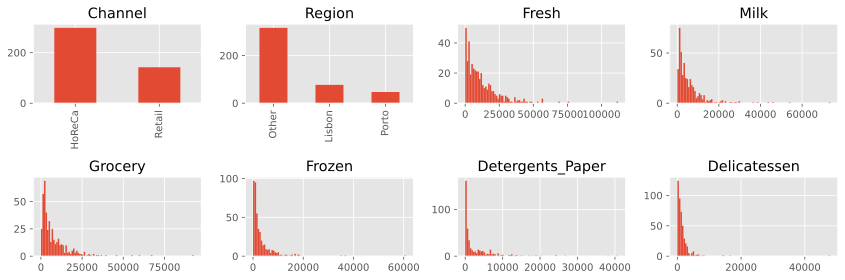

In [20]:
fig, axes = plt.subplots(2, 4, figsize=(12, 4))

for feature, ax in zip(features, axes.ravel()):
    if (feature=='Channel') | (feature=='Region'):
        df[feature].value_counts().plot.bar(ax=ax)
    else:
        ax.hist(df[feature], bins=100)
    ax.set_title(feature)
plt.tight_layout()

In [23]:
sns.pairplot?

Signature:
sns.pairplot(
    data,
    *,
    hue=None,
    hue_order=None,
    palette=None,
    vars=None,
    x_vars=None,
    y_vars=None,
    kind='scatter',
    diag_kind='auto',
    markers=None,
    height=2.5,
    aspect=1,
    corner=False,
    dropna=False,
    plot_kws=None,
    diag_kws=None,
    grid_kws=None,
    size=None,
)
Docstring:
Plot pairwise relationships in a dataset.

By default, this function will create a grid of Axes such that each numeric
variable in ``data`` will by shared across the y-axes across a single row and
the x-axes across a single column. The diagonal plots are treated
differently: a univariate distribution plot is drawn to show the marginal
distribution of the data in each column.

It is also possible to show a subset of variables or plot different
variables on the rows and columns.

This is a high-level interface for :class:`PairGrid` that is intended to
make it easy to draw a few common styles. You should use :class:`PairGrid`
directly if you

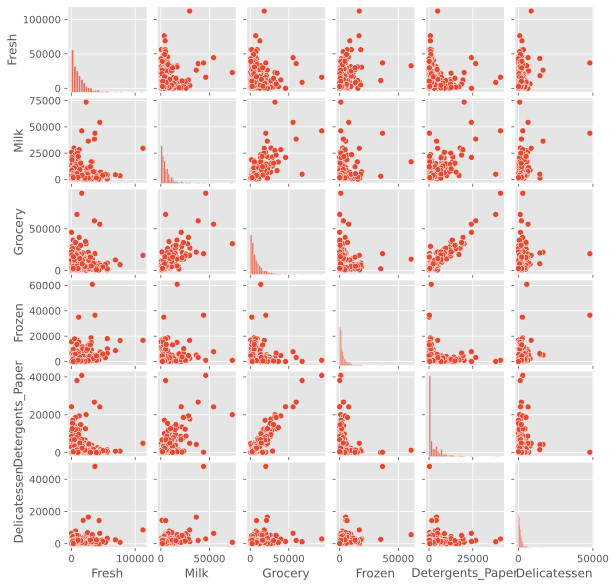

In [24]:
pplot = sns.pairplot(df, vars=features[2:])
pplot.fig.set_size_inches(8, 8)

In [25]:
#Principle Component analysis

In [28]:
import numpy as np
import pandas as pd

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

import matplotlib
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import matplotlib.pyplot as plt
plt.style.use('ggplot')


features = [
#     'Channel',
#     'Region',
    'Fresh',
    'Milk',
    'Grocery',
    'Frozen',
    'Detergents_Paper',
    'Delicatessen'
]

In [29]:
df = pd.read_csv('Data/data_processed.csv', index_col=0)

In [30]:
features

['Fresh', 'Milk', 'Grocery', 'Frozen', 'Detergents_Paper', 'Delicatessen']

In [31]:
data = df[features]

In [32]:
scaler = StandardScaler()
data = scaler.fit_transform(data)
data[:, 0].std()

1.0

In [33]:
np.save('Data/training_data.npy', data)

In [34]:
pca = PCA(n_components=2)
res_pca = pca.fit_transform(data)

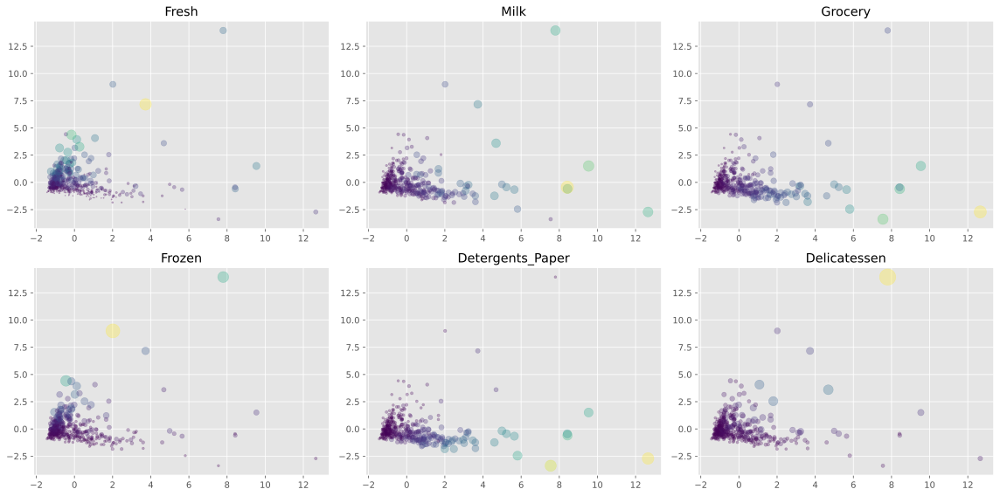

In [35]:
fig, axes = plt.subplots(2, 3, figsize=(16, 8))

for feature, ax in zip(features, axes.ravel()):
    cols = 'viridis'
    sizes = 20+20*data[:, features.index(feature)]
    ax.scatter(res_pca[:, 0], res_pca[:, 1], s=sizes, alpha=0.3, c=df[feature], cmap=cols)
    ax.set_title(feature)
plt.tight_layout()

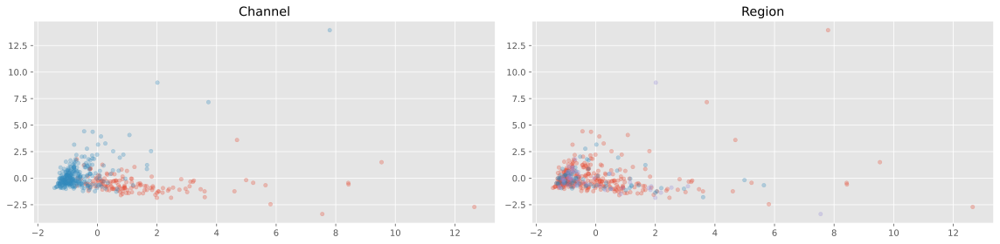

In [36]:
fig, axes = plt.subplots(1, 2, figsize=(16, 4))
for feature, ax in zip(['Channel', 'Region'], axes):
    cols = 'Pastel1'
    sizes = 20
    for unique_val in df[feature].unique():
        ax.scatter(res_pca[df[feature]==unique_val, 0], res_pca[df[feature]==unique_val, 1], s=20, alpha=0.3)
        ax.set_title(feature)
plt.tight_layout()

In [37]:
# Kernel Principal Component Analysis

In [38]:
import numpy as np
import pandas as pd

from sklearn.decomposition import KernelPCA

import matplotlib
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import matplotlib.pyplot as plt
plt.style.use('ggplot')


features = [
#     'Channel',
#     'Region',
    'Fresh',
    'Milk',
    'Grocery',
    'Frozen',
    'Detergents_Paper',
    'Delicatessen'
]

In [39]:
df = pd.read_csv('Data/data_processed.csv', index_col=0)
data = np.load('Data/training_data.npy')

In [ ]:
#Polynomial Function

In [40]:
kpca = KernelPCA(n_components=2, kernel='rbf', degree=2)
res_kpca_poly = kpca.fit_transform(data)

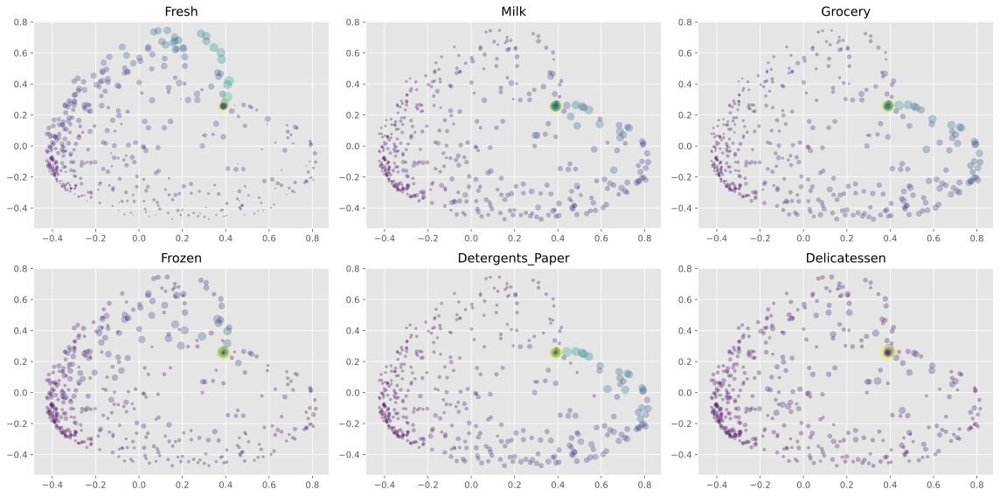

In [41]:
fig, axes = plt.subplots(2, 3, figsize=(16, 8))

for feature, ax in zip(features, axes.ravel()):
    cols = 'viridis'
    sizes = 20+20*data[:, features.index(feature)]
    ax.scatter(res_kpca_poly[:, 0], res_kpca_poly[:, 1], s=sizes, alpha=0.3, c=df[feature], cmap=cols)
    ax.set_title(feature)
plt.tight_layout()

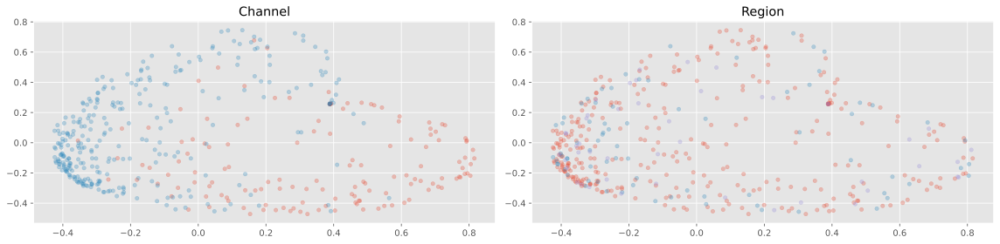

In [42]:
fig, axes = plt.subplots(1, 2, figsize=(16, 4))
for feature, ax in zip(['Channel', 'Region'], axes):
    cols = 'Pastel1'
    sizes = 20
    for unique_val in df[feature].unique():
        ax.scatter(res_kpca_poly[df[feature]==unique_val, 0], res_kpca_poly[df[feature]==unique_val, 1], s=20, alpha=0.3)
        ax.set_title(feature)
plt.tight_layout()

In [46]:
#Radial Basis Function

In [43]:
kpca = KernelPCA(n_components=2, kernel='rbf', gamma=0.05)
res_kpca_rbf = kpca.fit_transform(data)

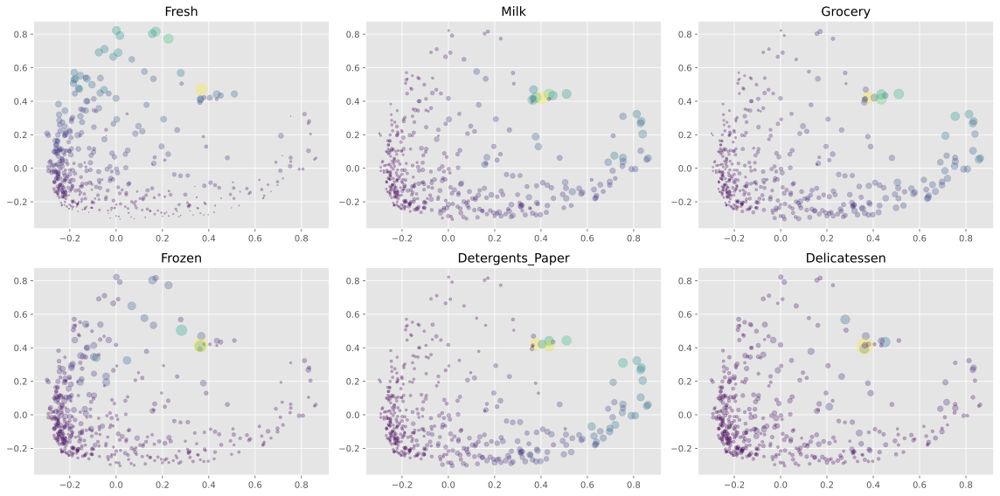

In [44]:
fig, axes = plt.subplots(2, 3, figsize=(16, 8))

for feature, ax in zip(features, axes.ravel()):
    cols = 'viridis'
    sizes = 20+20*data[:, features.index(feature)]
    ax.scatter(res_kpca_rbf[:, 0], res_kpca_rbf[:, 1], s=sizes, alpha=0.3, c=df[feature], cmap=cols)
    ax.set_title(feature)
plt.tight_layout()

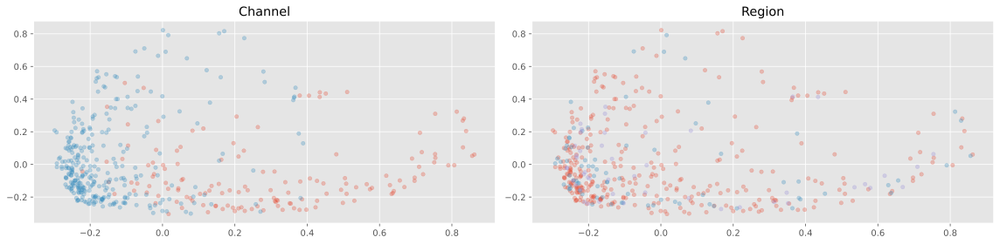

In [47]:
fig, axes = plt.subplots(1, 2, figsize=(16, 4))
for feature, ax in zip(['Channel', 'Region'], axes):
    cols = 'Pastel1'
    sizes = 20
    for unique_val in df[feature].unique():
        ax.scatter(res_kpca_rbf[df[feature]==unique_val, 0], res_kpca_rbf[df[feature]==unique_val, 1], s=20, alpha=0.3)
        ax.set_title(feature)
plt.tight_layout()

In [50]:
#Cosine Function

In [48]:
kpca = KernelPCA(n_components=2, kernel='cosine')
res_kpca_cos = kpca.fit_transform(data)

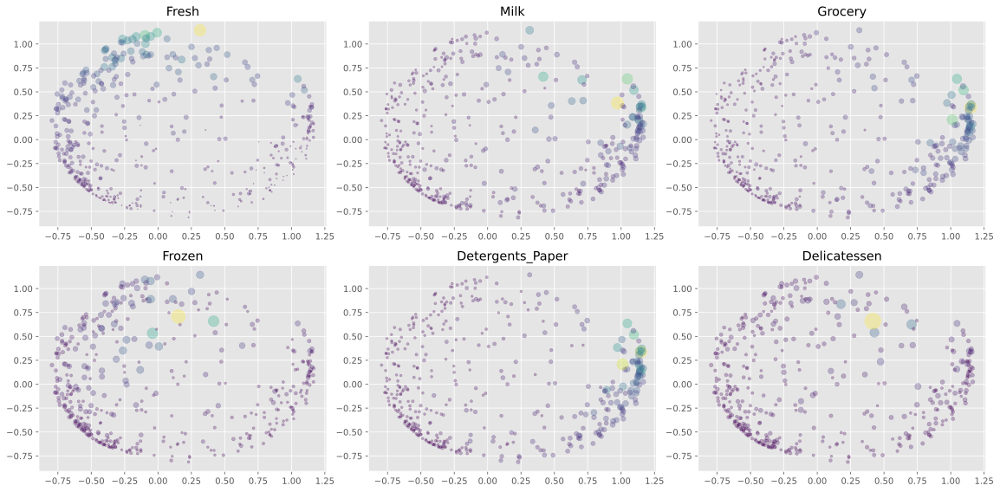

In [49]:
fig, axes = plt.subplots(2, 3, figsize=(16, 8))

for feature, ax in zip(features, axes.ravel()):
    cols = 'viridis'
    sizes = 20+20*data[:, features.index(feature)]
    ax.scatter(res_kpca_cos[:, 0], res_kpca_cos[:, 1], s=sizes, alpha=0.3, c=df[feature], cmap=cols)
    ax.set_title(feature)
plt.tight_layout()

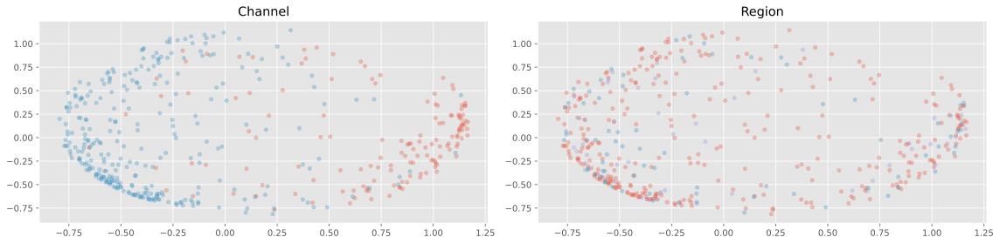

In [51]:
fig, axes = plt.subplots(1, 2, figsize=(16, 4))
for feature, ax in zip(['Channel', 'Region'], axes):
    cols = 'Pastel1'
    sizes = 20
    for unique_val in df[feature].unique():
        ax.scatter(res_kpca_cos[df[feature]==unique_val, 0], res_kpca_cos[df[feature]==unique_val, 1], s=20, alpha=0.3)
        ax.set_title(feature)
plt.tight_layout()

In [52]:
#Append to Dataframe

In [53]:
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
0,Retail,Other,12669,9656,7561,214,2674,1338
1,Retail,Other,7057,9810,9568,1762,3293,1776
2,Retail,Other,6353,8808,7684,2405,3516,7844
3,HoReCa,Other,13265,1196,4221,6404,507,1788
4,Retail,Other,22615,5410,7198,3915,1777,5185


In [54]:
df['x_kpca_rbf'] = res_kpca_rbf[:, 0]
df['y_kpca_rbf'] = res_kpca_rbf[:, 1]

df['x_kpca_poly'] = res_kpca_poly[:, 0]
df['y_kpca_poly'] = res_kpca_poly[:, 1]

df['x_kpca_cos'] = res_kpca_cos[:, 0]
df['y_kpca_cos'] = res_kpca_cos[:, 1]

In [55]:
df.to_csv('Data/data_with_latent.csv')

In [56]:
#K-Means Clustering

In [58]:
import numpy as np
import pandas as pd

from sklearn.cluster import KMeans

from yellowbrick.cluster import KElbowVisualizer

import matplotlib
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import matplotlib.pyplot as plt
plt.style.use('ggplot')


features = [
#     'Channel',
#     'Region',
    'Fresh',
    'Milk',
    'Grocery',
    'Frozen',
    'Detergents_Paper',
    'Delicatessen'
]

In [59]:
df = pd.read_csv('Data/data_with_latent.csv', index_col=0)
data = np.load('Data/training_data.npy')

In [60]:
res_kpca = df[['x_kpca_rbf', 'y_kpca_rbf']].to_numpy()

In [61]:
clusterer = KMeans(n_clusters=5)
clusters = clusterer.fit_predict(res_kpca)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [62]:
markers = list('*hH+xXDd|.,ov^<>12348spP')

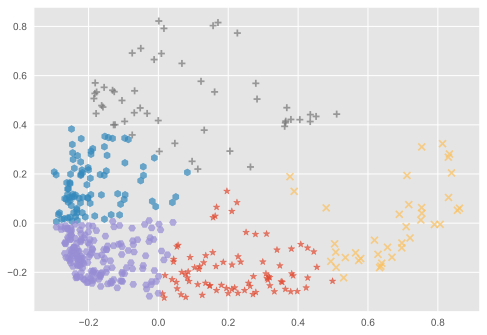

In [63]:
for cluster in np.unique(clusters):
    cluster_data = res_kpca[clusters==cluster]
    plt.scatter(cluster_data[:, 0], cluster_data[:, 1], alpha=0.7, marker=markers[cluster])

/var/folders/01/1v9jbr914kzdcvwsngqb1hk00000gn/T/ipykernel_79250/2956788956.py:8: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(cluster_data[:, 0], cluster_data[:, 1], s=sizes, alpha=0.6, cmap=cols, marker=markers[cluster], label=f'Cluster {cluster}')


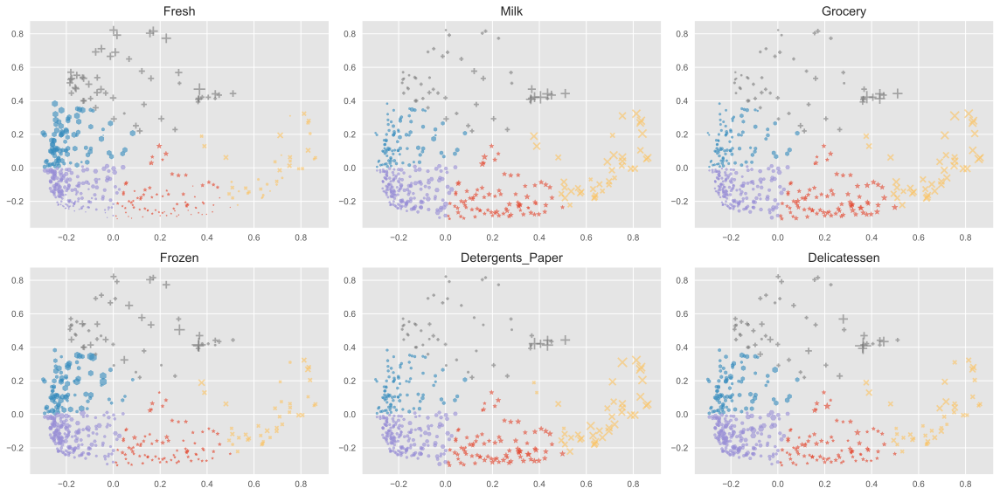

In [64]:
fig, axes = plt.subplots(2, 3, figsize=(16, 8))

for feature, ax in zip(features, axes.ravel()):
    cols = 'viridis'
    for cluster in np.unique(clusters):
        sizes = 20+20*data[:, features.index(feature)][clusters==cluster]
        cluster_data = res_kpca[clusters==cluster]
        ax.scatter(cluster_data[:, 0], cluster_data[:, 1], s=sizes, alpha=0.6, cmap=cols, marker=markers[cluster], label=f'Cluster {cluster}')
    ax.set_title(feature)
plt.tight_layout()

In [65]:
df['cluster_kpca_rbf'] = clusters
df.to_csv('Data/data_with_clusters.csv')

In [66]:
#Elbow Method

In [81]:
KElbowVisualizer?

Init signature:
KElbowVisualizer(
    estimator,
    ax=None,
    k=10,
    metric='distortion',
    distance_metric='euclidean',
    timings=True,
    locate_elbow=True,
    **kwargs,
)
Docstring:     
The K-Elbow Visualizer implements the "elbow" method of selecting the
optimal number of clusters for K-means clustering. K-means is a simple
unsupervised machine learning algorithm that groups data into a specified
number (k) of clusters. Because the user must specify in advance what k to
choose, the algorithm is somewhat naive -- it assigns all members to k
clusters even if that is not the right k for the dataset.

The elbow method runs k-means clustering on the dataset for a range of
values for k (say from 1-10) and then for each value of k computes an
average score for all clusters. By default, the ``distortion`` score is
computed, the sum of square distances from each point to its assigned
center. Other metrics can also be used such as the ``silhouette`` score,
the mean silhouette c

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to '

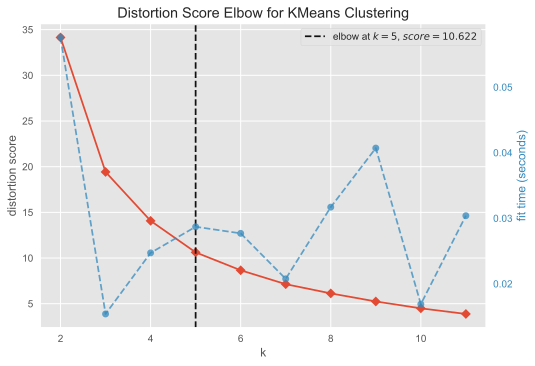

<AxesSubplot: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [68]:
clusterer = KMeans()
visualizer = KElbowVisualizer(clusterer, k=(2, 12), metric='distortion')

visualizer.fit(res_kpca)        
visualizer.show()

In [73]:
# Interactive Cluster Analsis 

In [74]:
import numpy as np
import pandas as pd

import plotly.graph_objects as go


features = [
#     'Channel',
#     'Region',
    'Fresh',
    'Milk',
    'Grocery',
    'Frozen',
    'Detergents_Paper',
    'Delicatessen'
]

In [75]:
df = pd.read_csv('Data/data_with_clusters.csv', index_col=0)
data = np.load('Data/training_data.npy')

In [76]:
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen,x_kpca_rbf,y_kpca_rbf,x_kpca_poly,y_kpca_poly,x_kpca_cos,y_kpca_cos,cluster_kpca_rbf
0,Retail,Other,12669,9656,7561,214,2674,1338,0.052874,-0.095702,0.078374,-0.173115,0.504789,0.009622,0
1,Retail,Other,7057,9810,9568,1762,3293,1776,0.129646,-0.160458,0.185813,-0.307415,0.889941,-0.262833,0
2,Retail,Other,6353,8808,7684,2405,3516,7844,0.210205,0.048446,0.341702,0.075048,0.473994,0.235687,0
3,HoReCa,Other,13265,1196,4221,6404,507,1788,-0.216243,0.105165,-0.253304,0.250352,-0.618611,0.370131,1
4,Retail,Other,22615,5410,7198,3915,1777,5185,-0.011687,0.265432,0.136617,0.375279,0.068900,0.861829,1


In [77]:
# CLuster Analysis

In [104]:
df.groupby(['cluster_kpca_rbf', 'Channel', 'Region'])[features].mean()

Fresh          Milk       Grocery  \
cluster_kpca_rbf Channel Region                                             
0                HoReCa  Lisbon   5620.000000  10123.400000   9722.000000   
                         Other    3393.636364   6987.818182  10161.454545   
                 Retail  Lisbon   2995.375000   7442.250000  14304.875000   
                         Other    5805.235294   7800.862745  12253.411765   
                         Porto    2993.500000   8762.333333  11137.333333   
1                HoReCa  Lisbon  17654.125000   1528.312500   2136.500000   
                         Other   18226.980769   2625.480769   3026.769231   
                         Porto   15619.916667   1842.583333   4108.250000   
                 Retail  Lisbon  15927.000000   5955.000000   7413.500000   
                         Other   19615.166667   5419.500000   7659.000000   
                         Porto   21952.500000   3872.500000   6766.500000   
2                HoReCa  Lisbon   6017.600000   2914.133333   2980.533333   
                         Other    5900.634783   2549.556522   2856.382609   
                         Porto    7070.600000   1708.266667   4009.933333   
                 Retail  Lisbon   2790.000000   2527.000000   5265.000000   
                         Other   11889.466667   4807.466667   7642.333333   
                         Porto   10708.666667   3779.666667   6193.333333   
3                HoReCa  Lisbon  37747.142857   6045.857143   7376.142857   
                         Other   39183.750000   6478.281250   6470.281250   
                         Porto   32717.000000  16784.000000  13626.000000   
                 Retail  Other   30796.400000  28588.500000  31077.300000   
                         Porto    8565.000000   4980.000000  67298.000000   
4                HoReCa  Lisbon   5909.000000  23527.000000  13699.000000   
                         Other   10683.000000  21858.000000  15400.000000   
                 Retail  Lisbon   4999.000000  17162.428571  28280.571429   
                         Other    5749.739130  15854.260870  25168.000000   
                         Porto    5135.571429  13998.142857  20566.428571   

                                       Frozen  Detergents_Paper  Delicatessen  
cluster_kpca_rbf Channel Region                                                
0                HoReCa  Lisbon   1732.600000       3729.200000   1815.400000  
                         Other    1628.090909       3728.818182   1271.363636  
                 Retail  Lisbon   1231.500000       5819.125000   2007.625000  
                         Other    1285.313725       5458.549020   1436.588235  
                         Porto     692.166667       5765.833333   1018.500000  
1                HoReCa  Lisbon   3483.500000        291.687500   1185.312500  
                         Other    4912.115385        511.557692   1061.403846  
                         Porto    5850.166667        464.166667   1144.000000  
                 Retail  Lisbon   5040.000000       1761.500000   1845.000000  
                         Other    2876.166667       1959.333333   2425.833333  
                         Porto    6462.000000       2221.500000   2812.500000  
2                HoReCa  Lisbon   1988.366667        922.000000    629.233333  
                         Other    1700.278261        598.608696    936.156522  
                         Porto    1986.000000        444.933333    775.200000  
                 Retail  Lisbon   5612.000000        788.000000   1360.000000  
                         Other    1136.733333       2761.933333   1007.200000  
                         Porto     898.666667       2860.666667    930.000000  
3                HoReCa  Lisbon   7186.714286        611.142857   2868.142857  
                         Other    9346.875000        914.062500   4325.062500  
                         Porto   60869.000000       1272.000000   5609.000000  
                 Retail  Other    2611.000000 

In [105]:

df.groupby(['cluster_kpca_rbf'])[features].mean()

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
cluster_kpca_rbf,,,,,,
0,4980.506173,7869.617284,11933.000000,1310.222222,5175.271605,1462.962963
1,17901.755556,2614.011111,3502.100000,4684.766667,628.444444,1241.733333
2,6583.340782,2749.860335,3444.296089,1733.698324,860.184358,879.446927
3,36614.823529,10926.960784,12752.529412,8559.156863,4021.607843,4066.647059
4,5635.333333,16106.589744,24356.205128,1975.487179,11103.205128,1945.307692


In [106]:
clusters = df.cluster_kpca_rbf

In [107]:
df_normalized = df.copy(deep=True)
# df_normalized.loc[:, features] = data
df_normalized[features] /= df[features].max()

In [108]:
df_normalized.max()

Channel               Retail
Region                 Porto
Fresh                    1.0
Milk                     1.0
Grocery                  1.0
Frozen                   1.0
Detergents_Paper         1.0
Delicatessen             1.0
x_kpca_rbf           0.86213
y_kpca_rbf          0.822088
x_kpca_poly         0.815626
y_kpca_poly         0.745111
x_kpca_cos          1.165908
y_kpca_cos           1.14398
cluster_kpca_rbf           4
dtype: object

In [109]:
biggest_cluster = df.groupby(['cluster_kpca_rbf']).count().max().max()

In [110]:
fig = go.Figure()

for cluster in np.unique(clusters):
    
    radii = df_normalized.loc[df_normalized.cluster_kpca_rbf==cluster, features].mean().tolist()
    thetas = features
    
    actual_values = df.loc[df.cluster_kpca_rbf==cluster, features].mean().tolist()
    cluster_size = len(df[df.cluster_kpca_rbf==cluster])
    print(cluster_size)
    fig.add_trace(
        go.Scatterpolar(
            r=radii + radii[:1],
            theta=thetas + thetas[:1],
            mode='lines',
            name=f'Cluster {cluster}',
            text = [f'Mean value: {x}' for x in actual_values + actual_values[:1]],
            line=dict(width=3),
            opacity=np.max([cluster_size/biggest_cluster, 0.6])
        )
    )

fig.update_layout(
    title='Cluster Analysis',
    showlegend=True,
    template='plotly_dark',
    width=800,
    autosize=False
)

fig.show()

81
90
179
51
39


In [111]:
fig.write_html('Demo.html')